## Importing necessary libraries

In [1]:
import tensorflow.compat.v1 as tf
from sklearn.metrics import confusion_matrix
import numpy as np
from scipy.io import loadmat
import os
from pywt import wavedec
from functools import reduce
from scipy import signal
from scipy.stats import entropy
from scipy.fft import fft, ifft
import pandas as pd
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from tensorflow import keras as K
import matplotlib.pyplot as plt
import scipy
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold,cross_validate
from tensorflow.keras.layers import Dense, Activation, Flatten, concatenate, Input, Dropout, LSTM, Bidirectional,BatchNormalization,PReLU,ReLU,Reshape
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.metrics import classification_report
from tensorflow.keras.models import Sequential, Model, load_model
import matplotlib.pyplot as plt;
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.decomposition import PCA
from tensorflow import keras
from sklearn.model_selection import cross_val_score
from tensorflow.keras.layers import Conv1D,Conv2D,Add
from tensorflow.keras.layers import MaxPool1D, MaxPooling2D
import seaborn as sns

## Reading EEG data along with Subject Demographics.

In [2]:
data = pd.read_csv("../input/confused-eeg/EEG_data.csv")
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12811 entries, 0 to 12810
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   SubjectID           12811 non-null  float64
 1   VideoID             12811 non-null  float64
 2   Attention           12811 non-null  float64
 3   Mediation           12811 non-null  float64
 4   Raw                 12811 non-null  float64
 5   Delta               12811 non-null  float64
 6   Theta               12811 non-null  float64
 7   Alpha1              12811 non-null  float64
 8   Alpha2              12811 non-null  float64
 9   Beta1               12811 non-null  float64
 10  Beta2               12811 non-null  float64
 11  Gamma1              12811 non-null  float64
 12  Gamma2              12811 non-null  float64
 13  predefinedlabel     12811 non-null  float64
 14  user-definedlabeln  12811 non-null  float64
dtypes: float64(15)
memory usage: 1.5 MB
None


In [3]:
demo_data = pd.read_csv('../input/confused-eeg/demographic_info.csv')
demo_data

,subject ID,age,ethnicity,gender
0,0,25,Han Chinese,M
1,1,24,Han Chinese,M
2,2,31,English,M
3,3,28,Han Chinese,F
4,4,24,Bengali,M
5,5,24,Han Chinese,M
6,6,24,Han Chinese,M
7,7,25,Han Chinese,M
8,8,25,Han Chinese,M
9,9,24,Han Chinese,F


### Combining the 2 CSV files on SubjectID

In [4]:
demo_data = demo_data.rename(columns = {'subject ID': 'SubjectID'})
data = data.merge(demo_data,how = 'inner',on = 'SubjectID')
data.head()

,SubjectID,VideoID,Attention,Mediation,Raw,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,predefinedlabel,user-definedlabeln,age,ethnicity,gender
0,0.0,0.0,56.0,43.0,278.0,301963.0,90612.0,33735.0,23991.0,27946.0,45097.0,33228.0,8293.0,0.0,0.0,25,Han Chinese,M
1,0.0,0.0,40.0,35.0,-50.0,73787.0,28083.0,1439.0,2240.0,2746.0,3687.0,5293.0,2740.0,0.0,0.0,25,Han Chinese,M
2,0.0,0.0,47.0,48.0,101.0,758353.0,383745.0,201999.0,62107.0,36293.0,130536.0,57243.0,25354.0,0.0,0.0,25,Han Chinese,M
3,0.0,0.0,47.0,57.0,-5.0,2012240.0,129350.0,61236.0,17084.0,11488.0,62462.0,49960.0,33932.0,0.0,0.0,25,Han Chinese,M
4,0.0,0.0,44.0,53.0,-8.0,1005145.0,354328.0,37102.0,88881.0,45307.0,99603.0,44790.0,29749.0,0.0,0.0,25,Han Chinese,M


### One hot encoding categorical variables

The Categorical variables here include 'Ethnicity', 'Gender'.

In [5]:
data = pd.get_dummies(data)

## Understanding the Variables and relationships between them.

In [6]:
import pandas_profiling as pp
pp.ProfileReport(data)

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

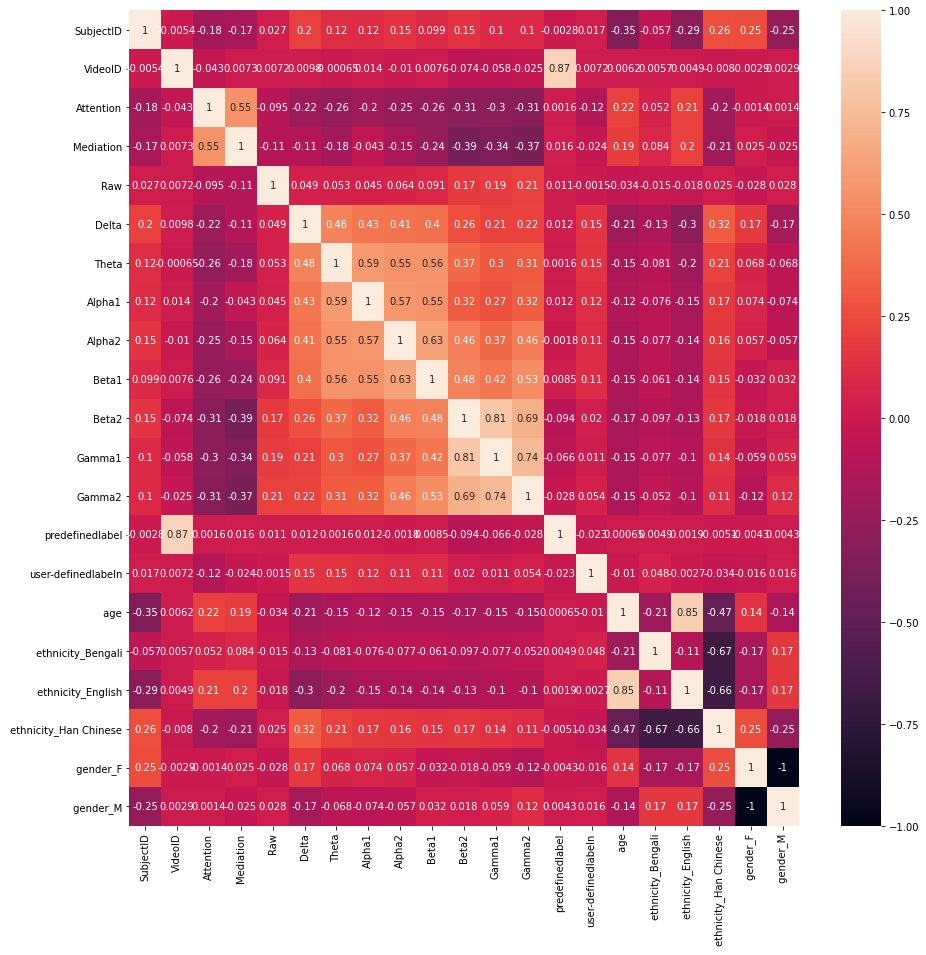

In [7]:
plt.figure(figsize = (15,15))
cor_matrix = data.corr()
sns.heatmap(cor_matrix,annot=True)

It was mentioned in the Description of the Dataset that features like 'VideoID' and 'SubjectID'. The SubjectID and VideoID will provide hinderance while model training as there are 10 clips for 10 students and these 1-2 min clips are divided ino parts of 0.5 sec samples. So Model will most probably learn based on IDs but we want it to learn on based of EEG recordings, ethinicity and gender and age parameters.

## Defining necessary features for model training

In [8]:
data.drop(columns = ['SubjectID','VideoID','predefinedlabel'],inplace=True)

In [9]:
y= data.pop('user-definedlabeln')
x= data

Before Normalization

<AxesSubplot:>

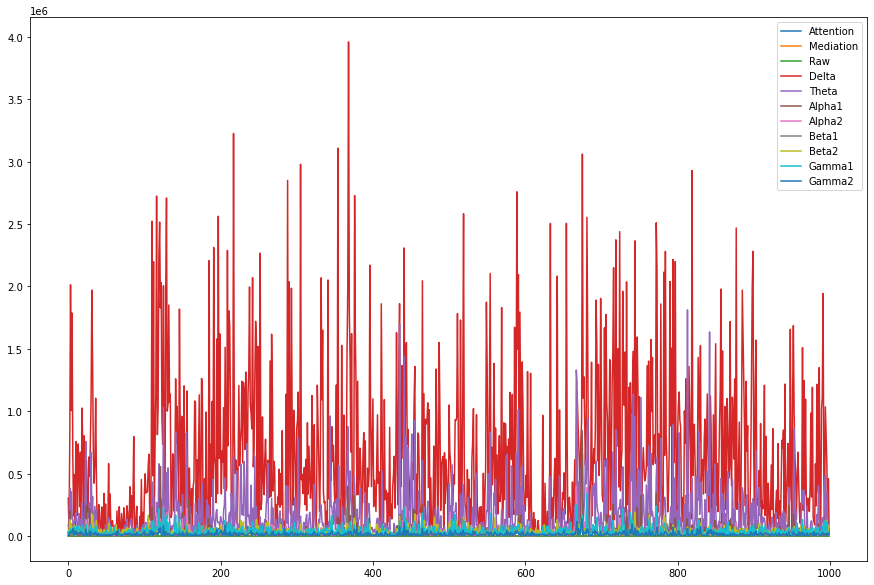

In [10]:
x.iloc[:1000,:11].plot(figsize = (15,10))

The scale of some EEG features were wide, so we use Z-score normalization.

In [11]:
x = StandardScaler().fit_transform(x)

After Normalization

<AxesSubplot:>

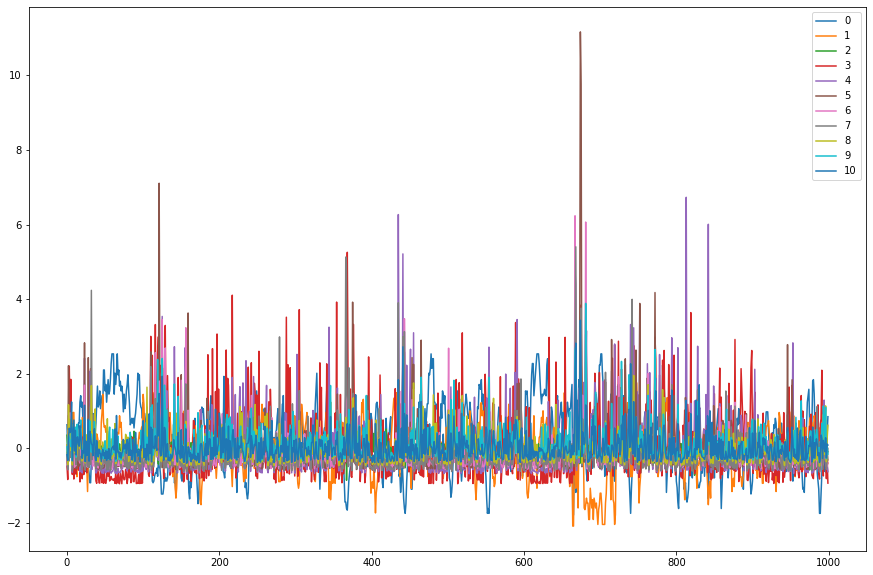

In [12]:
pd.DataFrame(x).iloc[:1000,:11].plot(figsize = (15,10))

### Dividing into Training and Validation sets

In [13]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.15)

In [14]:
x_train.shape, x_test.shape,y_train.shape,y_test.shape

((10889, 17), (1922, 17), (10889,), (1922,))

## Reshaping the data as required by the model

In [15]:
x_train = np.array(x_train).reshape(-1,17,1)
x_test = np.array(x_test).reshape(-1,17,1)


In [16]:
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((10889, 17, 1), (1922, 17, 1), (10889,), (1922,))

## Defining the Model's architecture

In [17]:
inputs = tf.keras.Input(shape=(17,1))

Dense1 = Dense(64, activation = 'relu',kernel_regularizer=keras.regularizers.l2())(inputs)

#Dense2 = Dense(128, activation = 'relu',kernel_regularizer=keras.regularizers.l2())(Dense1)
#Dense3 = Dense(256, activation = 'relu',kernel_regularizer=keras.regularizers.l2())(Dense2)

lstm_1=  Bidirectional(LSTM(256, return_sequences = True))(Dense1)
drop = Dropout(0.3)(lstm_1)
lstm_3=  Bidirectional(LSTM(128, return_sequences = True))(drop)
drop2 = Dropout(0.3)(lstm_3)

flat = Flatten()(drop2)

#Dense_1 = Dense(256, activation = 'relu')(flat)

Dense_2 = Dense(128, activation = 'relu')(flat)
outputs = Dense(1, activation='sigmoid')(Dense_2)

model = tf.keras.Model(inputs, outputs)

model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 17, 1)]           0         
_________________________________________________________________
dense (Dense)                (None, 17, 64)            128       
_________________________________________________________________
bidirectional (Bidirectional (None, 17, 512)           657408    
_________________________________________________________________
dropout (Dropout)            (None, 17, 512)           0         
_________________________________________________________________
bidirectional_1 (Bidirection (None, 17, 256)           656384    
_________________________________________________________________
dropout_1 (Dropout)          (None, 17, 256)           0         
_________________________________________________________________
flatten (Flatten)            (None, 4352)              0     

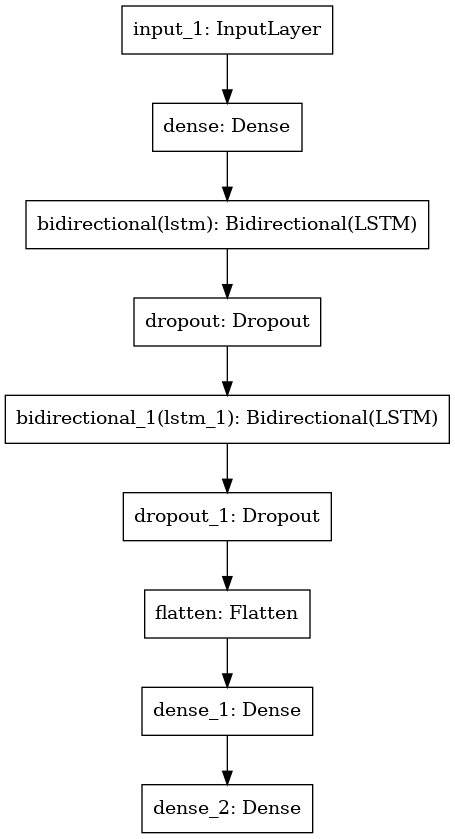

In [18]:
tf.keras.utils.plot_model(model)

The loss function used will be 'Binary CrossEntropy'. We will be using callback functions like Early_Stopping to avoid overfitting and lr_scheduler to change the learning rate while model trains.

We will be training for 100 epochs starting with learning_rate = 0.001 and batch_size = 20.

In [19]:
def train_model(model,x_train, y_train,x_test,y_test, save_to, epoch = 2):

        opt_adam = keras.optimizers.Adam(learning_rate=0.001)

        es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
        mc = ModelCheckpoint(save_to + '_best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
        lr_schedule = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 0.001 * np.exp(-epoch / 10.))
        
        model.compile(optimizer=opt_adam,
                  loss=['binary_crossentropy'],
                  metrics=['accuracy'])
        
        history = model.fit(x_train,y_train,
                        batch_size=20,
                        epochs=epoch,
                        validation_data=(x_test,y_test),
                        callbacks=[es,mc,lr_schedule])
        
        saved_model = load_model(save_to + '_best_model.h5')
        
        return model,history

In [20]:
model,history = train_model(model, x_train, y_train,x_test, y_test, save_to= './', epoch = 100) 

Epoch 1/100
545/545 [==============================] - 59s 98ms/step - loss: 0.6922 - accuracy: 0.5645 - val_loss: 0.6509 - val_accuracy: 0.6223

Epoch 00001: val_accuracy improved from -inf to 0.62227, saving model to ./_best_model.h5
Epoch 2/100
545/545 [==============================] - 51s 94ms/step - loss: 0.6552 - accuracy: 0.6096 - val_loss: 0.6459 - val_accuracy: 0.6176

Epoch 00002: val_accuracy did not improve from 0.62227
Epoch 3/100
545/545 [==============================] - 51s 94ms/step - loss: 0.6423 - accuracy: 0.6295 - val_loss: 0.6314 - val_accuracy: 0.6535

Epoch 00003: val_accuracy improved from 0.62227 to 0.65349, saving model to ./_best_model.h5
Epoch 4/100
545/545 [==============================] - 51s 93ms/step - loss: 0.6401 - accuracy: 0.6300 - val_loss: 0.6488 - val_accuracy: 0.6337

Epoch 00004: val_accuracy did not improve from 0.65349
Epoch 5/100
545/545 [==============================] - 52s 95ms/step - loss: 0.6371 - accuracy: 0.6340 - val_loss: 0.6196 -

## Plotting the Training and Validation Accuracy along with losses

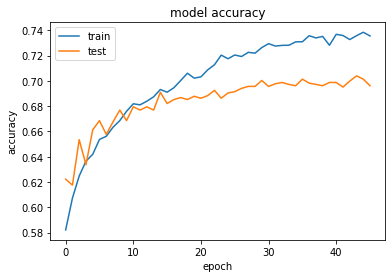

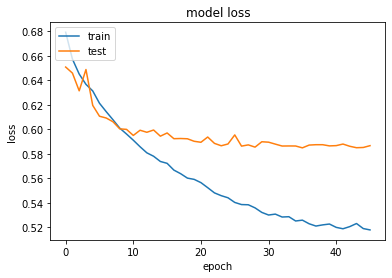

In [21]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## Analyzing the results.

1. Confusion Matrix

In [22]:
y_pred =model.predict(x_test)
y_pred = np.array(y_pred >= 0.5, dtype = np.int)
confusion_matrix(y_test, y_pred)

array([[651, 305],
       [279, 687]])

In [23]:
y_pred

array([[1],
       [1],
       [1],
       ...,
       [1],
       [1],
       [1]])

2. Classification Report

In [24]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.70      0.68      0.69       956
         1.0       0.69      0.71      0.70       966

    accuracy                           0.70      1922
   macro avg       0.70      0.70      0.70      1922
weighted avg       0.70      0.70      0.70      1922



## Please upvote if you found it useful :)